# TASK #1: UNDERSTAND THE PROBLEM STATMENT AND BUSINESS CASE

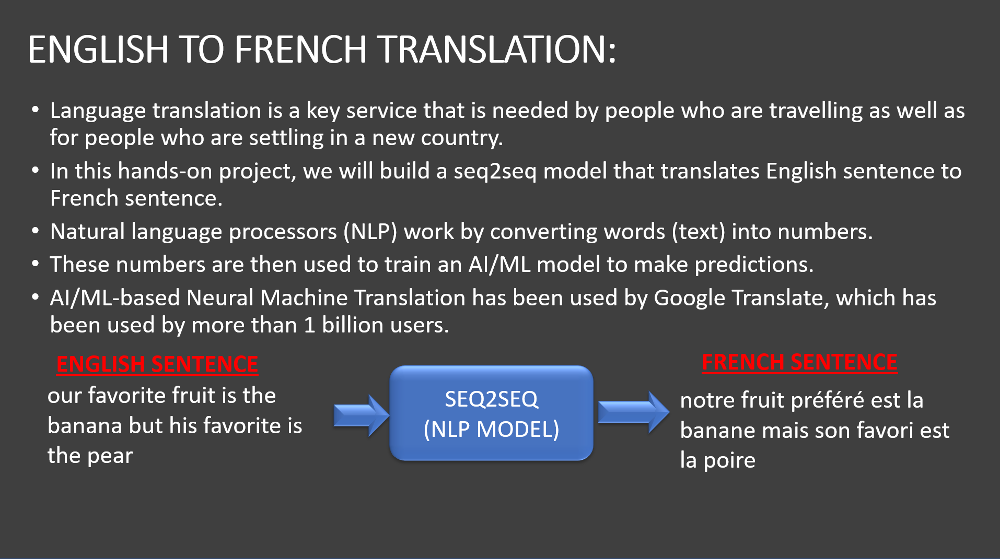

# TASK #2: IMPORT LIBRARIES AND DATASETS

In [1]:
!pip install --upgrade tensorflow-gpu==2.9.1

In [2]:
# install nltk
!pip install nltk
# install gensim
!pip install gensim
# install spacy
!pip install spacy
!pip install plotly
!pip install wordcloud

In [3]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
from collections import Counter
import operator
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, TimeDistributed, RepeatVector, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model

In [5]:
# load the data
df_english = pd.read_csv('small_vocab_en.csv', sep = '/t', names = ['english'],engine='python')
df_french = pd.read_csv('small_vocab_fr.csv', sep = '/t', names = ['french'],engine='python')

In [6]:
df_english.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137860 entries, 0 to 137859
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   english  137860 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


In [7]:
df_english.sample(frac=0.05)

,english
93049,"china is usually beautiful during april , and ..."
10348,"china is relaxing during spring , and it is us..."
53851,"france is nice during fall , but it is freezin..."
70654,"he dislikes lemons , peaches , and mangoes."
78244,the monkey was my most loved animal .
...,...
100750,"new jersey is usually wet during may , but it ..."
64726,"china is never nice during april , but it is u..."
123106,"he likes limes , grapefruit , and strawberries ."
92584,"new jersey is sometimes nice during july , and..."


In [8]:
df_french.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137860 entries, 0 to 137859
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   french  137860 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


In [9]:
df_french.sample(frac=0.05)

,french
105911,"notre fruit préféré est le raisin , mais mon p..."
115067,elle déteste le petit camion rouge .
76908,"paris est jamais froid en janvier , et il est ..."
123292,les états-unis est parfois enneigée en septemb...
2355,"le pamplemousse est votre fruit préféré , mais..."
...,...
113835,"chine est chaud en juillet , mais il est calme..."
68815,cet éléphant était son animal préféré moins .
16758,"l'orange est leur fruit préféré moins , mais l..."
25200,"le pamplemousse est son fruit préféré moins , ..."


In [10]:
df_english.isnull().any()

english    False
dtype: bool

In [11]:
df_french.isnull().any()

french    False
dtype: bool

In [12]:
df = pd.concat([df_english,df_french],axis=1)
df.sample(frac=0.05)

,english,french
117821,"china is never wet during october , but it is ...","chine est jamais humide en octobre , mais il e..."
115237,"china is wonderful during april , but it is ne...","chine est merveilleux en avril , mais il est j..."
2625,"the strawberry is their favorite fruit , but t...","la fraise est leur fruit préféré , mais la ban..."
132481,"china is sometimes wet during winter , but it ...","la chine est parfois humide pendant l' hiver ,..."
132547,"the united states is chilly during march , but...","les états-unis est froid au mois de mars , mai..."
...,...,...
120286,"india is never pleasant during april , but it ...","l' inde est jamais agréable en avril , mais il..."
1470,"he likes bananas , pears , and oranges .","il aime les bananes , les poires et les oranges ."
27132,"france is mild during summer , and it is warm ...","france est doux pendant l' été , et il est cha..."
83937,"her favorite fruit is the peach , but their fa...","son fruit préféré est la pêche , mais leur fav..."


In [13]:
print(f'Total English Records = {len(df)}')
print(f'Total French Records = {len(df)}')

Total English Records = 137860
Total French Records = 137860


# TASK #3: PERFORM DATA CLEANING

In [14]:
# download nltk packages
nltk.download('punkt')

# download stopwords
nltk.download("stopwords")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [15]:
# function to remove punctuations
def remove_punc(x):
  return re.sub('[!#?,.:";]', '', x)

In [16]:
df['french'] = df['french'].apply(remove_punc)
df['english'] = df['english'].apply(remove_punc)

In [17]:
english_words = []
french_words  = []

In [18]:
def add_words(text,word_list):
    for word in text.split():
        if word not in word_list:
            word_list.append(word)

df['english'].apply(lambda x: add_words(x, english_words))
df['french'].apply(lambda x: add_words(x, french_words))

0         None
1         None
2         None
3         None
4         None
          ... 
137855    None
137856    None
137857    None
137858    None
137859    None
Name: french, Length: 137860, dtype: object

In [19]:
len(english_words)

199

In [20]:
# number of unique words in french
len(french_words)

350

In [21]:
print(english_words)

['new', 'jersey', 'is', 'sometimes', 'quiet', 'during', 'autumn', 'and', 'it', 'snowy', 'in', 'april', 'the', 'united', 'states', 'usually', 'chilly', 'july', 'freezing', 'november', 'california', 'march', 'hot', 'june', 'mild', 'cold', 'september', 'your', 'least', 'liked', 'fruit', 'grape', 'but', 'my', 'apple', 'his', 'favorite', 'orange', 'paris', 'relaxing', 'december', 'busy', 'spring', 'never', 'our', 'lemon', 'january', 'warm', 'lime', 'her', 'banana', 'he', 'saw', 'a', 'old', 'yellow', 'truck', 'india', 'rainy', 'that', 'cat', 'was', 'most', 'loved', 'animal', 'dislikes', 'grapefruit', 'limes', 'lemons', 'february', 'china', 'pleasant', 'october', 'wonderful', 'nice', 'summer', 'france', 'may', 'grapes', 'mangoes', 'their', 'mango', 'pear', 'august', 'beautiful', 'apples', 'peaches', 'feared', 'shark', 'wet', 'dry', 'we', 'like', 'oranges', 'they', 'pears', 'she', 'little', 'red', 'winter', 'disliked', 'rusty', 'car', 'strawberries', 'i', 'strawberry', 'bananas', 'going', 'to'

In [22]:
print(french_words)

['new', 'jersey', 'est', 'parfois', 'calme', 'pendant', "l'", 'automne', 'et', 'il', 'neigeux', 'en', 'avril', 'les', 'états-unis', 'généralement', 'froid', 'juillet', 'gèle', 'habituellement', 'novembre', 'california', 'mars', 'chaud', 'juin', 'légère', 'fait', 'septembre', 'votre', 'moins', 'aimé', 'fruit', 'le', 'raisin', 'mais', 'mon', 'la', 'pomme', 'son', 'préféré', "l'orange", 'paris', 'relaxant', 'décembre', 'occupé', 'au', 'printemps', 'jamais', 'chaude', 'notre', 'citron', 'janvier', 'chaux', 'des', 'fruits', 'banane', 'a', 'vu', 'un', 'vieux', 'camion', 'jaune', 'inde', 'pluvieux', 'ce', 'chat', 'était', 'animal', 'plus', "n'aime", 'pamplemousse', 'citrons', 'verts', 'californie', 'ne', 'février', 'gel', 'chine', 'agréable', 'octobre', 'merveilleux', 'doux', 'tranquille', 'à', "l'automne", 'été', 'france', 'mois', 'de', 'mai', 'frisquet', 'déteste', 'raisins', 'mangues', 'leur', 'mangue', 'poire', 'août', 'beau', 'pommes', 'pêches', 'redouté', 'que', 'requin', 'humide', "d'"

# TASK #4: VISUALIZE CLEANED UP DATASET

In [23]:
# Obtain list of all words in the dataset
words = []
for i in df['english']:
  for word in i.split():
    words.append(word)

In [24]:
# Obtain the total count of words
english_words_counts = Counter(words)
english_words_counts

Counter({'new': 12197,
         'jersey': 11225,
         'is': 205858,
         'sometimes': 37746,
         'quiet': 8693,
         'during': 74933,
         'autumn': 9004,
         'and': 59850,
         'it': 75137,
         'snowy': 8898,
         'in': 75525,
         'april': 8954,
         'the': 67628,
         'united': 11270,
         'states': 11270,
         'usually': 37507,
         'chilly': 8770,
         'july': 8956,
         'freezing': 8928,
         'november': 8951,
         'california': 11250,
         'march': 9023,
         'hot': 8639,
         'june': 9133,
         'mild': 8743,
         'cold': 8878,
         'september': 8958,
         'your': 9734,
         'least': 27564,
         'liked': 14046,
         'fruit': 27192,
         'grape': 4848,
         'but': 63987,
         'my': 9700,
         'apple': 4848,
         'his': 9700,
         'favorite': 28332,
         'orange': 4848,
         'paris': 11334,
         'relaxing': 8696,
         'decem

In [25]:
# sort the dictionary by values
english_words_counts = sorted(english_words_counts.items(), key = operator.itemgetter(1), reverse = True)

In [26]:
english_words_counts

[('is', 205858),
 ('in', 75525),
 ('it', 75137),
 ('during', 74933),
 ('the', 67628),
 ('but', 63987),
 ('and', 59850),
 ('sometimes', 37746),
 ('usually', 37507),
 ('never', 37500),
 ('favorite', 28332),
 ('least', 27564),
 ('fruit', 27192),
 ('most', 14934),
 ('loved', 14166),
 ('liked', 14046),
 ('new', 12197),
 ('paris', 11334),
 ('india', 11277),
 ('united', 11270),
 ('states', 11270),
 ('california', 11250),
 ('jersey', 11225),
 ('france', 11170),
 ('china', 10953),
 ('he', 10786),
 ('she', 10786),
 ('grapefruit', 10692),
 ('your', 9734),
 ('my', 9700),
 ('his', 9700),
 ('her', 9700),
 ('fall', 9134),
 ('june', 9133),
 ('spring', 9102),
 ('january', 9090),
 ('winter', 9038),
 ('march', 9023),
 ('autumn', 9004),
 ('may', 8995),
 ('nice', 8984),
 ('september', 8958),
 ('july', 8956),
 ('april', 8954),
 ('november', 8951),
 ('summer', 8948),
 ('december', 8945),
 ('february', 8942),
 ('our', 8932),
 ('their', 8932),
 ('freezing', 8928),
 ('pleasant', 8916),
 ('beautiful', 8915),
 ('

In [27]:
# append the values to a list for visualization purposes
english_words = []
english_counts = []
for i in range(len(english_words_counts)):
  english_words.append(english_words_counts[i][0])
  english_counts.append(english_words_counts[i][1])

In [28]:
# Plot barplot using plotly 
fig = px.bar(x = english_words, y = english_counts)
fig.show()

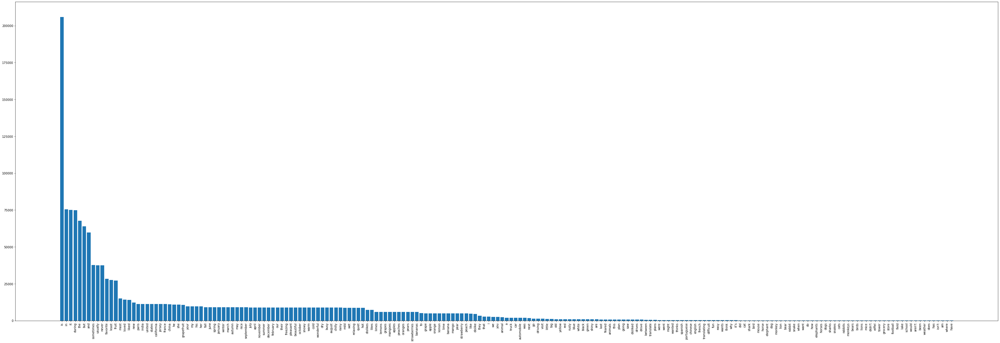

In [29]:
plt.figure(figsize = (60,20)) 
plt.bar(english_words,english_counts)
plt.xticks(rotation = 90)
plt.show()

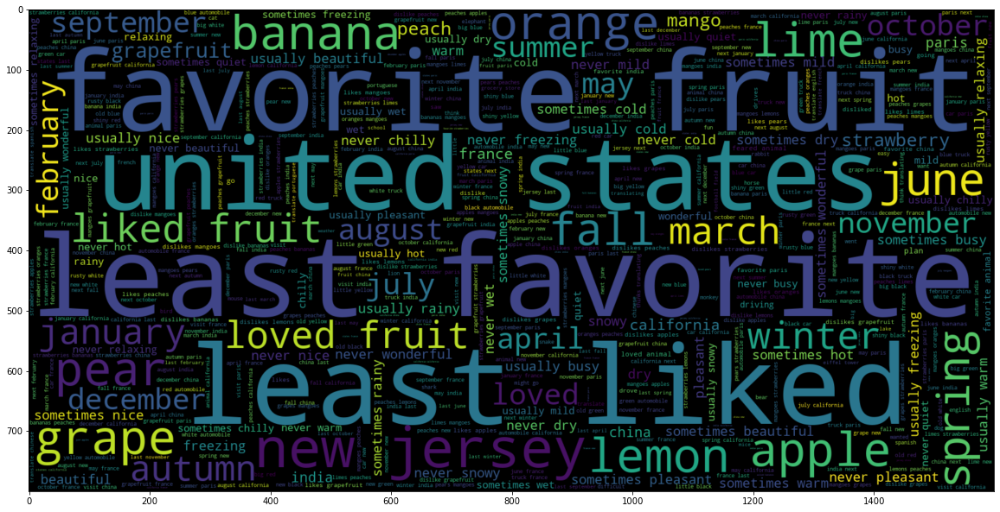

In [30]:
# plot the word cloud for text that is Real
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000, width = 1600, height = 800 ).generate(" ".join(df.english))
plt.imshow(wc, interpolation = 'bilinear')

In [31]:
df.english[0]
nltk.word_tokenize(df.english[0])

['new',
 'jersey',
 'is',
 'sometimes',
 'quiet',
 'during',
 'autumn',
 'and',
 'it',
 'is',
 'snowy',
 'in',
 'april']

In [32]:
# Maximum length (number of words) per document. We will need it later for embeddings
maxlen_english = -1
for doc in df.english:
    tokens = nltk.word_tokenize(doc)
    if(maxlen_english < len(tokens)):
        maxlen_english = len(tokens)
print("The maximum number of words in any document = ", maxlen_english)

The maximum number of words in any document =  15


In [33]:
frenchword = []
for i in df.french:
    for word in i.split():
        frenchword.append(word)

In [34]:
french_words_counts = Counter(frenchword)
french_words_counts

Counter({'new': 11047,
         'jersey': 11052,
         'est': 196809,
         'parfois': 37746,
         'calme': 7256,
         'pendant': 10741,
         "l'": 32917,
         'automne': 14727,
         'et': 59851,
         'il': 84079,
         'neigeux': 1867,
         'en': 105768,
         'avril': 8954,
         'les': 65255,
         'états-unis': 11210,
         'généralement': 31292,
         'froid': 16794,
         'juillet': 8956,
         'gèle': 3622,
         'habituellement': 6215,
         'novembre': 8951,
         'california': 3061,
         'mars': 9023,
         'chaud': 16405,
         'juin': 9133,
         'légère': 63,
         'fait': 2916,
         'septembre': 8958,
         'votre': 9368,
         'moins': 27557,
         'aimé': 25852,
         'fruit': 23626,
         'le': 35306,
         'raisin': 4852,
         'mais': 63987,
         'mon': 9403,
         'la': 49861,
         'pomme': 4848,
         'son': 16496,
         'préféré': 23305,
   

In [35]:
french_words_counts = sorted(french_words_counts.items(), key = operator.itemgetter(1),reverse=True)

In [36]:
# append the values to a list for visualization purposes
french_words = []
french_counts = []
for i in range(len(french_words_counts)):
  french_words.append(french_words_counts[i][0])
  french_counts.append(french_words_counts[i][1])

In [37]:
fig = px.bar(x= french_words,y = french_counts)
fig.show()

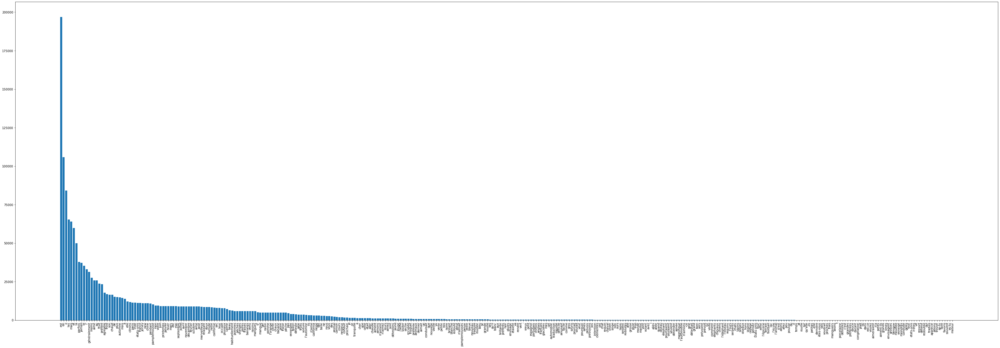

In [38]:
plt.figure(figsize = (60,20)) 
plt.bar(french_words,french_counts)
plt.xticks(rotation = 90)
plt.show()

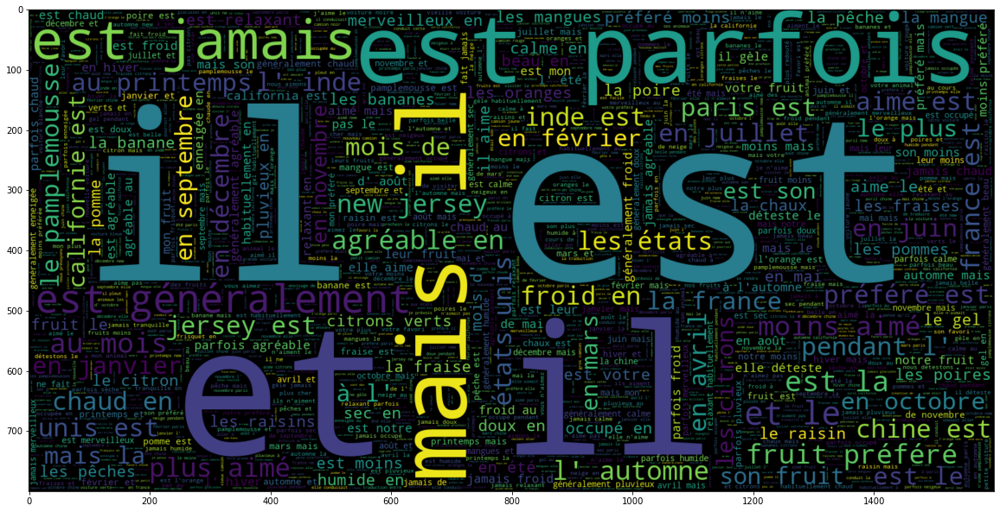

In [39]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud(max_words=2000,width=1600,height=800).generate(' '.join(df.french)), interpolation='bilinear')

In [40]:
# Maximum length (number of words) per document. We will need it later for embeddings
maxlen_french = -1
for doc in df.french:
    tokens = nltk.word_tokenize(doc)
    if(maxlen_french < len(tokens)):
        maxlen_french = len(tokens)
print("The maximum number of words in any document = ", maxlen_french)

The maximum number of words in any document =  23


# TASK #5: PREPARE THE DATA BY PERFORMING TOKENIZATION AND PADDING

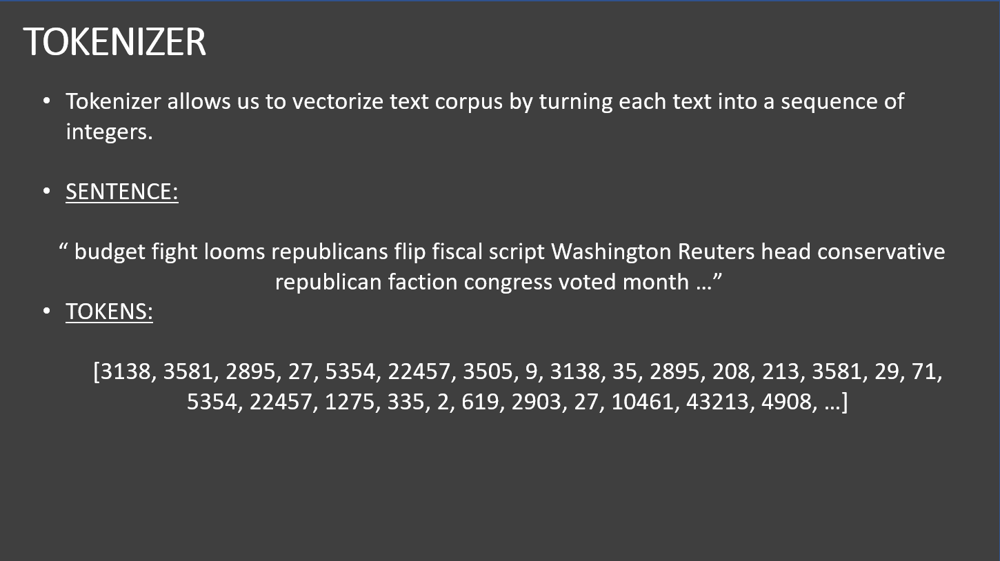

In [41]:
def tokenize_and_pad(x, maxlen):
  #  a tokenier to tokenize the words and create sequences of tokenized words
  tokenizer = Tokenizer(char_level = False)
  tokenizer.fit_on_texts(x)
  sequences = tokenizer.texts_to_sequences(x)
  padded = pad_sequences(sequences, maxlen = maxlen, padding = 'post')
  return tokenizer, sequences, padded

In [42]:
# tokenize and padding to the data 
x_tokenizer, x_sequences, x_padded = tokenize_and_pad(df.english, maxlen_english)
y_tokenizer, y_sequences, y_padded = tokenize_and_pad(df.french,  maxlen_french)

In [43]:
# Total vocab size, since we added padding we add 1 to the total word count
total_english_words = len(english_words)
english_vocab_size = total_english_words + 1
print("Complete English Vocab Size:", english_vocab_size)

Complete English Vocab Size: 200


In [44]:
# Total vocab size, since we added padding we add 1 to the total word count
total_french_words = len(french_words)
french_vocab_size = total_french_words + 1
print("Complete French Vocab Size:", french_vocab_size)

Complete French Vocab Size: 351


In [45]:
print("The tokenized version for document\n", df.english[-1:].item(),"\n is : ", x_padded[-1:])

The tokenized version for document
 the orange is her favorite fruit  but the banana is your favorite  
 is :  [[ 5 84  1 32 11 13  6  5 87  1 29 11  0  0  0]]


In [46]:
print("The tokenized version for document\n", df.french[-1:].item(),"\n is : ", y_padded[-1:])

The tokenized version for document
 l'orange est son fruit préféré  mais la banane est votre favori  
 is :  [[84  1 20 16 17  5  7 87  1 40 93  0  0  0  0  0  0  0  0  0  0  0  0]]


In [47]:
# function to obtain the text from padded variables
def pad_to_text(padded, tokenizer):

    id_to_word = {id: word for word, id in tokenizer.word_index.items()}
    id_to_word[0] = ''

    return ' '.join([id_to_word[j] for j in padded])

In [48]:
pad_to_text(y_padded[0], y_tokenizer).strip()

"new jersey est parfois calme pendant l' automne et il est neigeux en avril"

In [49]:
pad_to_text(x_padded[0],x_tokenizer).strip()

'new jersey is sometimes quiet during autumn and it is snowy in april'

In [50]:
# Train test split
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_padded, y_padded, test_size = 0.1)

# TASK #6: UNDERSTAND THE THEORY AND INTUITION BEHIND RECURRENT NEURAL NETWORKS AND LSTM


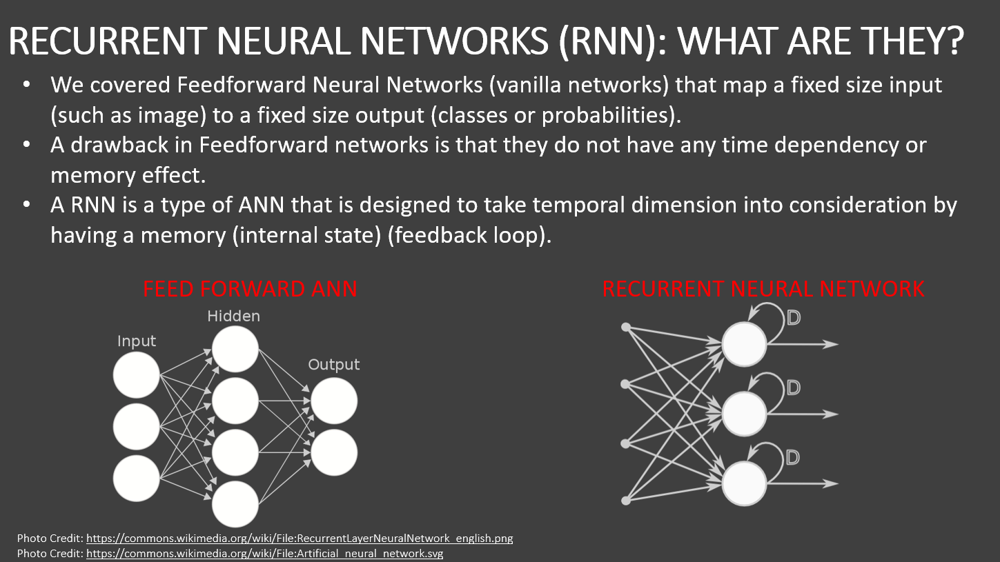

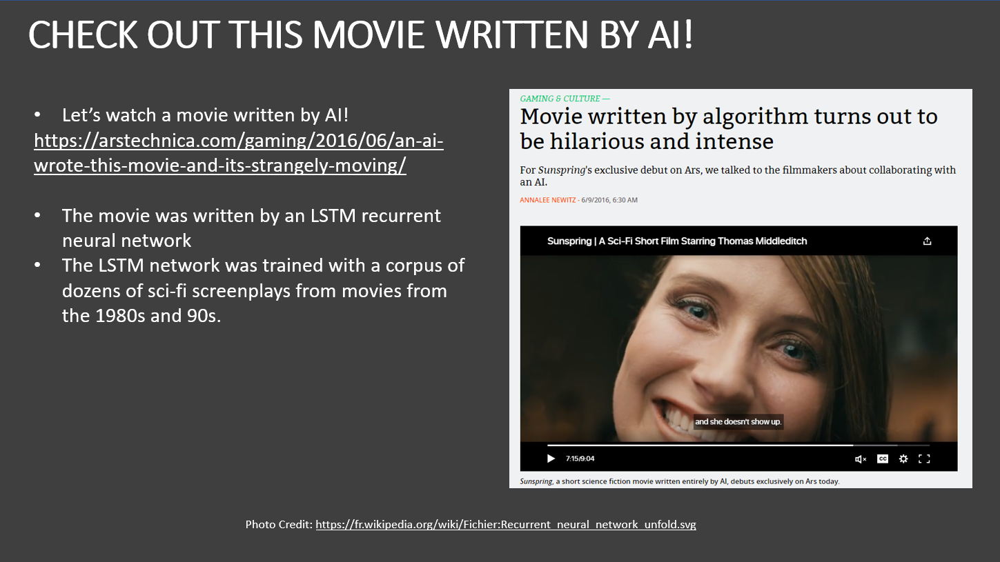

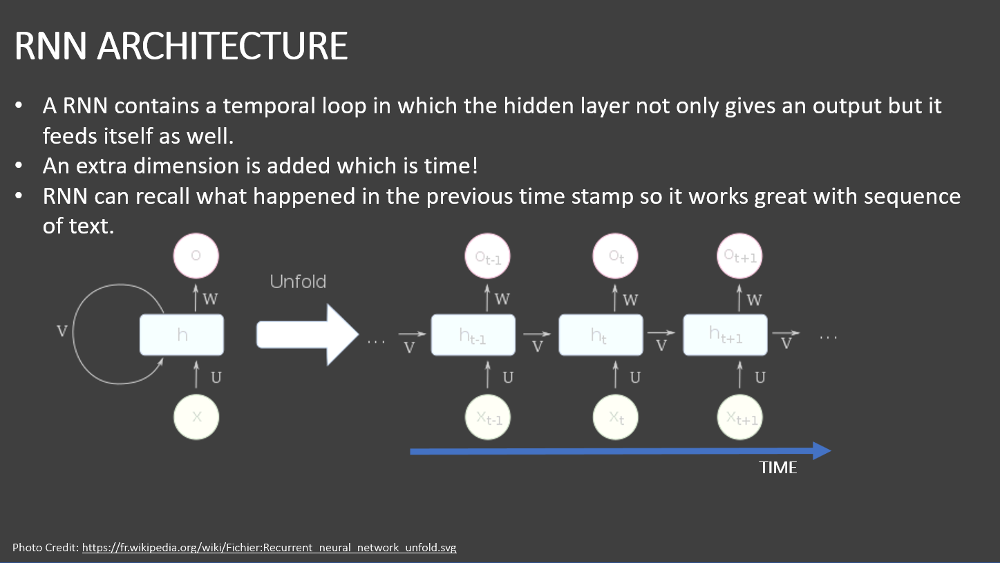

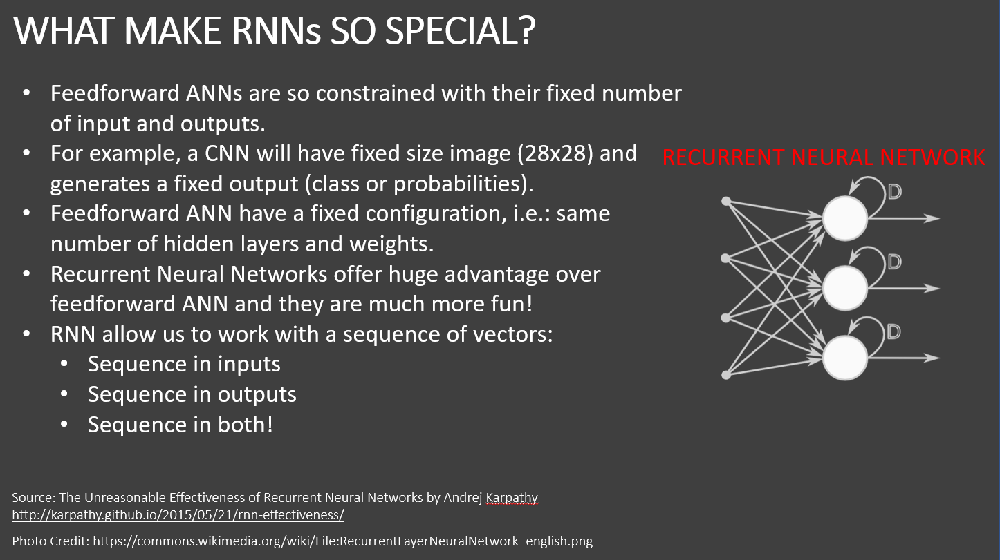

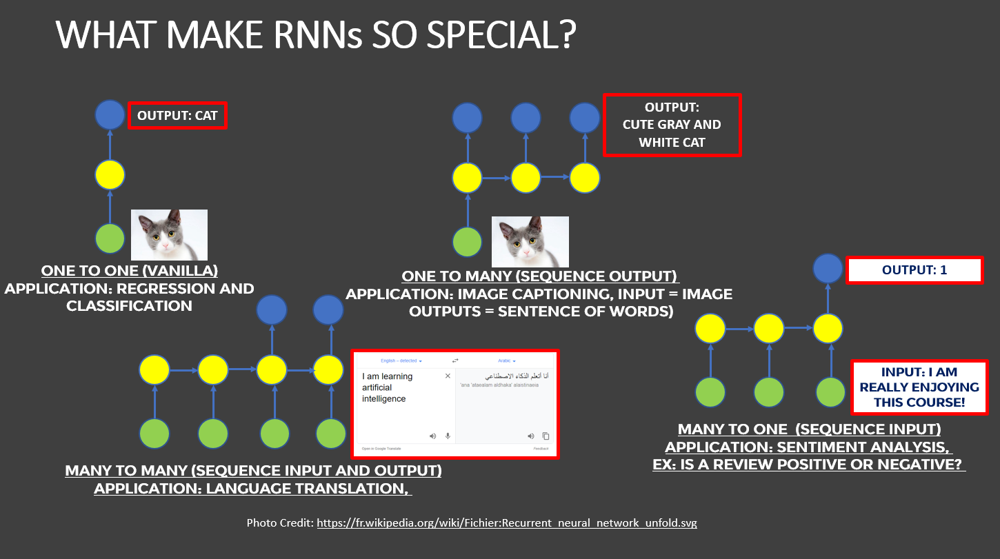

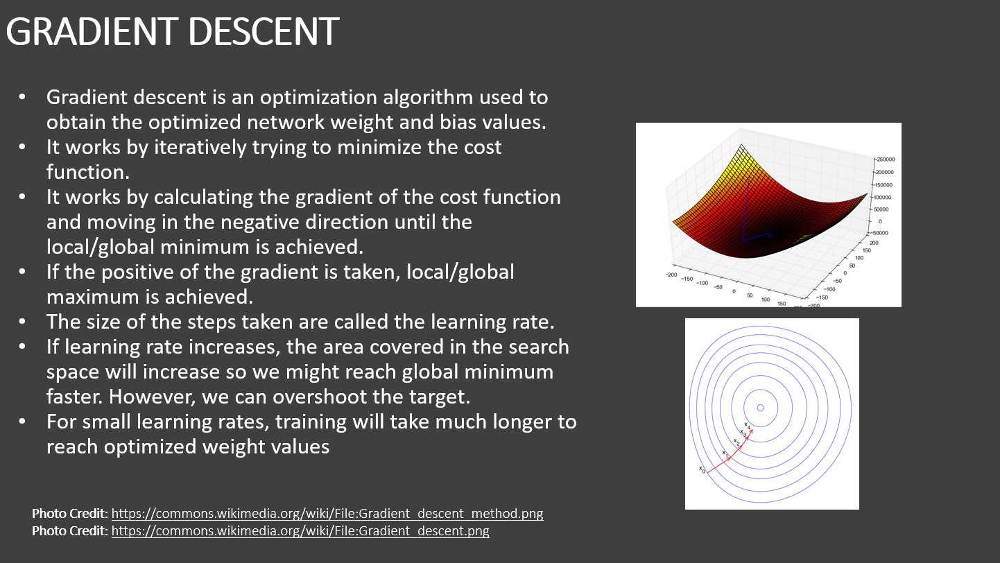

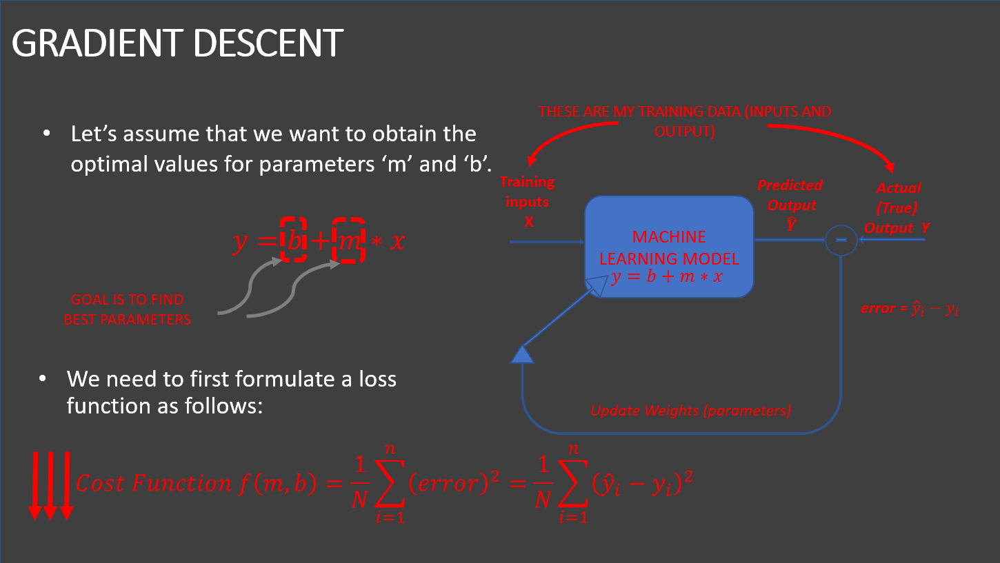

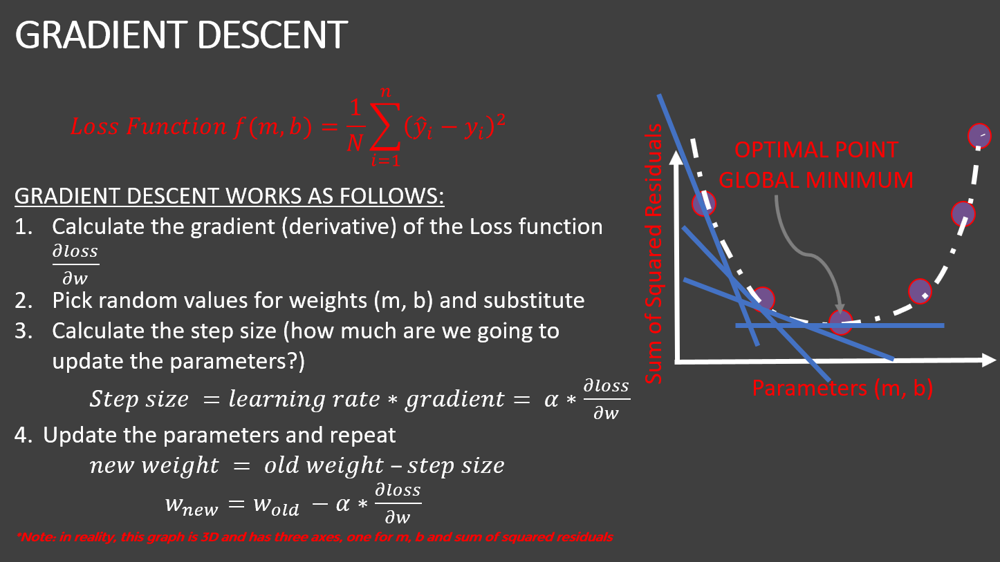

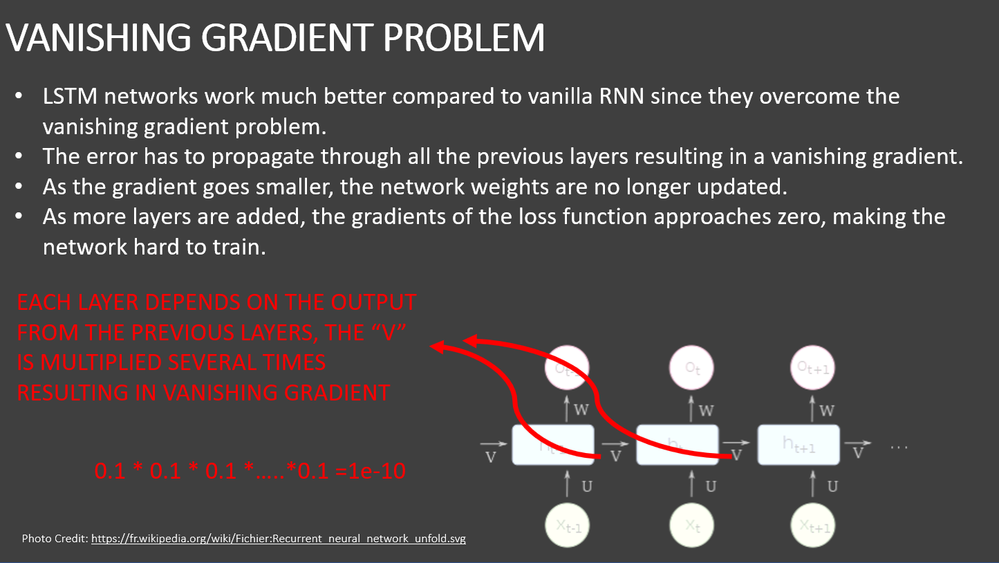

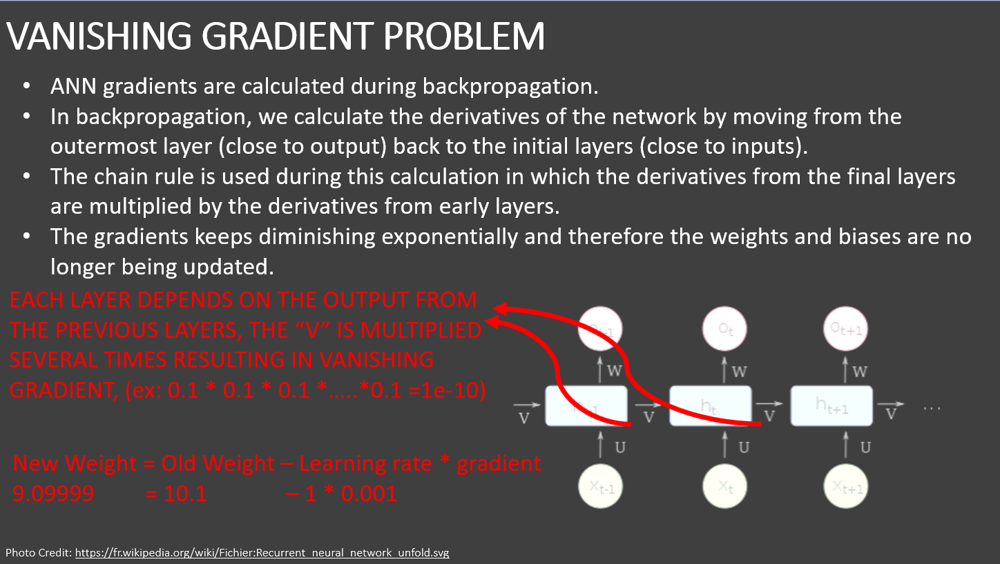

# TASK #7: UNDERSTAND THE INTUITION BEHIND LONG SHORT TERM MEMORY (LSTM) NETWORKS

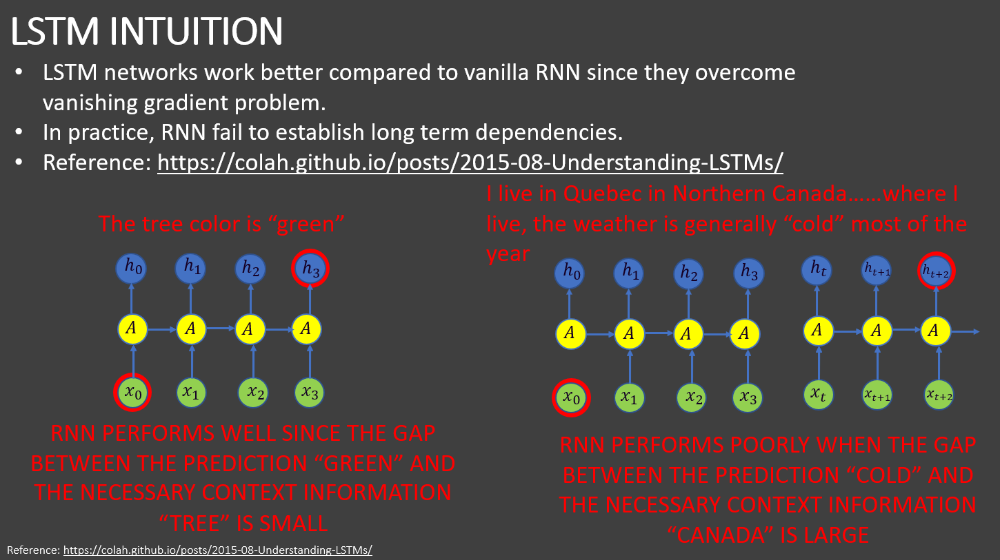

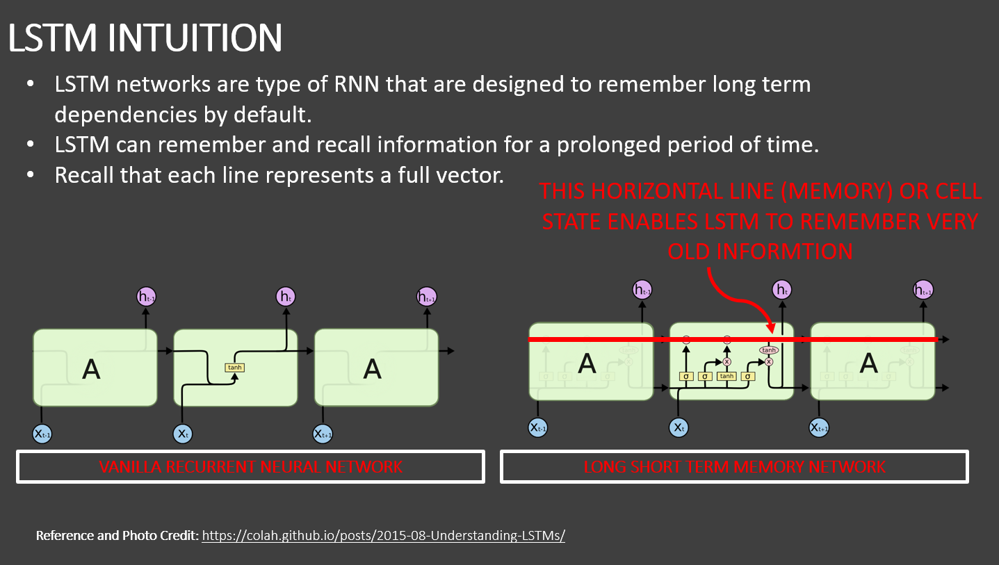

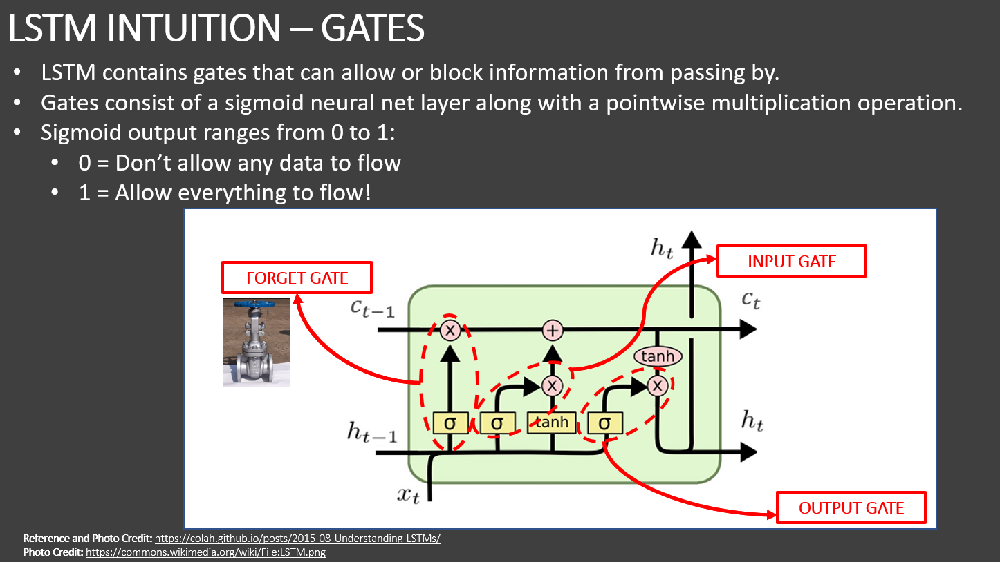

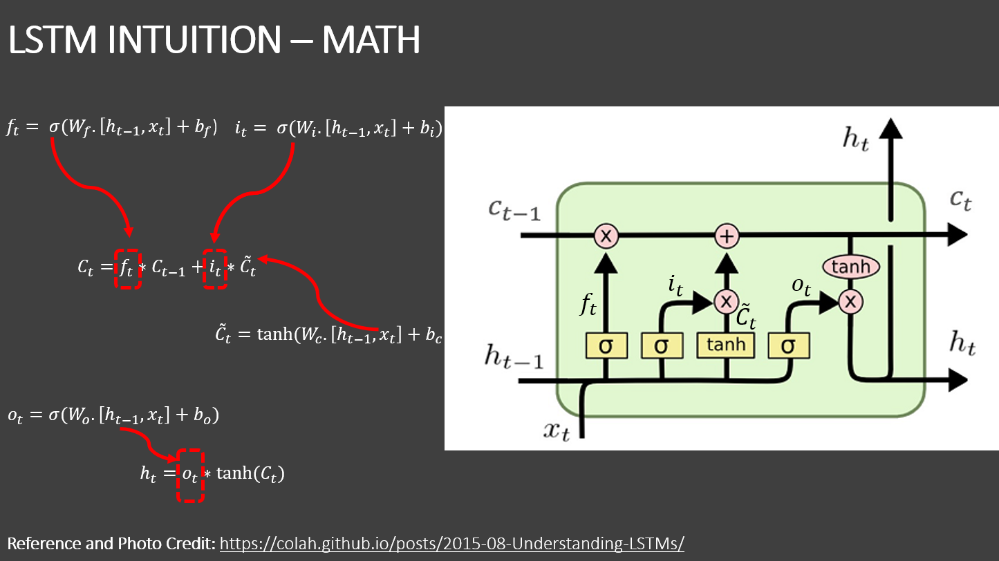

# TASK #8: BUILD AND TRAIN THE MODEL 

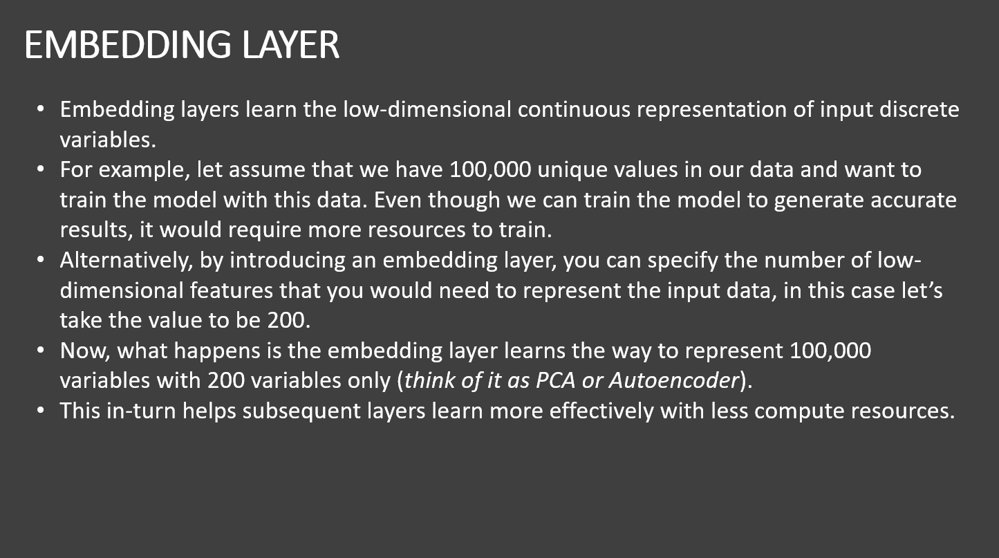

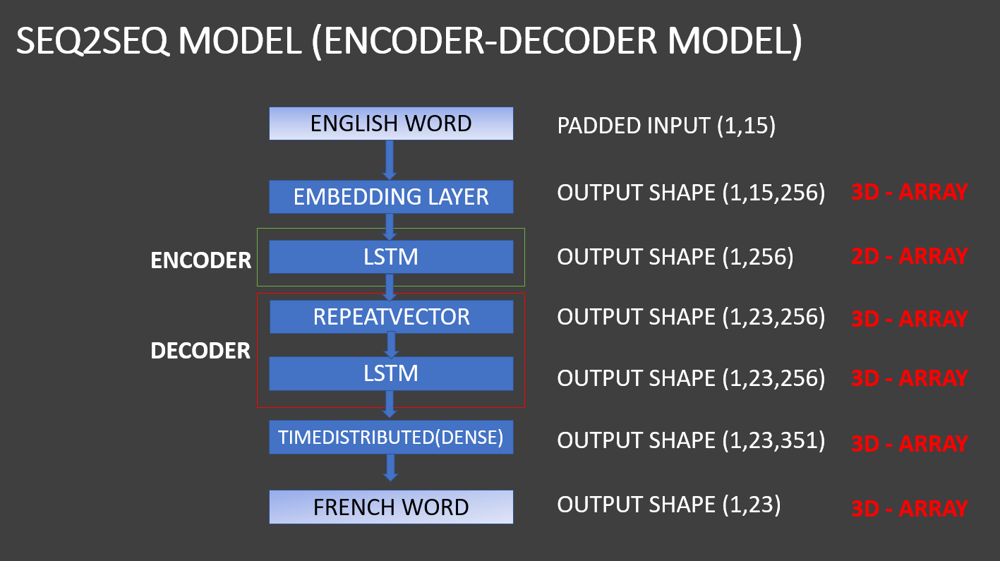

## Model -1

In [51]:
# Sequential Model
model = Sequential()
# embedding layer
model.add(Embedding(english_vocab_size, 256, input_length = maxlen_english, mask_zero = True))
# encoder
model.add(LSTM(256))
# decoder
# repeatvector repeats the input for the desired number of times to change
# 2D-array to 3D array. For example: (1,256) to (1,23,256)
model.add(RepeatVector(maxlen_french))
model.add(LSTM(256, return_sequences= True ))
model.add(TimeDistributed(Dense(french_vocab_size, activation ='softmax')))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 15, 256)           51200     
                                                                 
 lstm (LSTM)                 (None, 256)               525312    
                                                                 
 repeat_vector (RepeatVector  (None, 23, 256)          0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 23, 256)           525312    
                                                                 
 time_distributed (TimeDistr  (None, 23, 351)          90207     
 ibuted)                                                         
                                                                 
Total params: 1,192,031
Trainable params: 1,192,031
Non-

In [52]:
# change the shape of target from 2D to 3D
y_train = np.expand_dims(y_train, axis = 2)
y_train.shape

(124074, 23, 1)

In [53]:
# train the model
model.fit(x_train, y_train, batch_size=1024, validation_split= 0.1, epochs=10)

Epoch 1/10
110/110 [==============================] - 113s 991ms/step - loss: 2.6824 - accuracy: 0.4981 - val_loss: 2.0867 - val_accuracy: 0.5506
Epoch 2/10
110/110 [==============================] - 103s 941ms/step - loss: 1.8452 - accuracy: 0.5763 - val_loss: 1.6039 - val_accuracy: 0.6057
Epoch 3/10
110/110 [==============================] - 103s 939ms/step - loss: 1.4927 - accuracy: 0.6173 - val_loss: 1.3887 - val_accuracy: 0.6349
Epoch 4/10
110/110 [==============================] - 104s 943ms/step - loss: 1.2968 - accuracy: 0.6518 - val_loss: 1.2755 - val_accuracy: 0.6521
Epoch 5/10
110/110 [==============================] - 103s 939ms/step - loss: 1.1302 - accuracy: 0.6831 - val_loss: 1.0575 - val_accuracy: 0.6967
Epoch 6/10
110/110 [==============================] - 103s 938ms/step - loss: 0.9842 - accuracy: 0.7194 - val_loss: 0.9209 - val_accuracy: 0.7344
Epoch 7/10
110/110 [==============================] - 103s 936ms/step - loss: 0.8656 - accuracy: 0.7493 - val_loss: 0.8743 -

In [54]:
# save the model
model.save("weights.h5")

## Model -2

In [55]:
# Sequential Model
model_1 = Sequential()
# embedding layer
model_1.add(Embedding(english_vocab_size, 400, input_length = maxlen_english, mask_zero = True))
# encoder
model_1.add(LSTM(400))
# decoder
# repeatvector repeats the input for the desired number of times to change
# 2D-array to 3D array. For example: (1,400) to (1,23,400)
model_1.add(RepeatVector(maxlen_french))
model_1.add(LSTM(400, return_sequences= True ))
model_1.add(TimeDistributed(Dense(french_vocab_size, activation ='softmax')))
model_1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 15, 400)           80000     
                                                                 
 lstm_2 (LSTM)               (None, 400)               1281600   
                                                                 
 repeat_vector_1 (RepeatVect  (None, 23, 400)          0         
 or)                                                             
                                                                 
 lstm_3 (LSTM)               (None, 23, 400)           1281600   
                                                                 
 time_distributed_1 (TimeDis  (None, 23, 351)          140751    
 tributed)                                                       
                                                                 
Total params: 2,783,951
Trainable params: 2,783,951
No

In [56]:
model_1.fit(x_train, y_train, batch_size=1024, validation_split= 0.1, epochs=20)

Epoch 1/20
110/110 [==============================] - 189s 2s/step - loss: 2.6069 - accuracy: 0.5006 - val_loss: 1.8958 - val_accuracy: 0.5561
Epoch 2/20
110/110 [==============================] - 188s 2s/step - loss: 1.6334 - accuracy: 0.5939 - val_loss: 1.4699 - val_accuracy: 0.6197
Epoch 3/20
110/110 [==============================] - 192s 2s/step - loss: 1.3272 - accuracy: 0.6446 - val_loss: 1.2004 - val_accuracy: 0.6728
Epoch 4/20
110/110 [==============================] - 188s 2s/step - loss: 1.0808 - accuracy: 0.6996 - val_loss: 1.0142 - val_accuracy: 0.7113
Epoch 5/20
110/110 [==============================] - 188s 2s/step - loss: 0.8914 - accuracy: 0.7426 - val_loss: 0.8544 - val_accuracy: 0.7467
Epoch 6/20
110/110 [==============================] - 185s 2s/step - loss: 0.7615 - accuracy: 0.7769 - val_loss: 0.7145 - val_accuracy: 0.7915
Epoch 7/20
110/110 [==============================] - 184s 2s/step - loss: 0.6442 - accuracy: 0.8141 - val_loss: 0.7162 - val_accuracy: 0.7855

In [57]:
model_1.save("weights_1.h5")

# TASK #9: ASSESS TRAINED MODEL PERFORMANCE


In [58]:
y_test.shape

(13786, 23)

In [59]:
x_test.shape

(13786, 15)

In [68]:
# function to make prediction
def prediction(x,specified_model, x_tokenizer = x_tokenizer, y_tokenizer = y_tokenizer):
    predictions = specified_model.predict(x, verbose=0)[0]
    id_to_word = {id: word for word, id in y_tokenizer.word_index.items()}
    id_to_word[0] = ''
    return ' '.join([id_to_word[j] for j in np.argmax(predictions,1)])

## Actual English - Actual French - Predicted French Comparison

Model-1

In [69]:
for i in range(20):

  print('Original English Sentence - {}\n'.format(pad_to_text(x_test[i], x_tokenizer)))
  print('Original French Sentence - {}\n'.format(pad_to_text(y_test[i], y_tokenizer)))
  print('Predicted French Sentence - {}\n\n\n\n'.format(prediction(x_test[i:i+1],model)))

Original English Sentence - new jersey is never warm during september and it is usually rainy in april 

Original French Sentence - new jersey est jamais chaud en septembre et il est généralement pluvieux en avril         

Predicted French Sentence - new jersey est jamais froid en septembre et il est jamais en en avril         




Original English Sentence - california is usually beautiful during spring but it is busy in fall   

Original French Sentence - californie est généralement beau au printemps mais il est occupé à l' automne          

Predicted French Sentence - californie est généralement agréable en printemps mais il est généralement à l' automne          




Original English Sentence - his most loved fruit is the lime but our most loved is the lemon 

Original French Sentence - son fruit le plus aimé est la chaux mais notre plus aimé est le citron        

Predicted French Sentence - son fruit le plus aimé est la pomme mais son plus aimé est le raisin        




Origina

In [71]:
y_prediction_list = [ prediction(x_test[i:i+1],model) for i in range(0,len(y_test))]

In [72]:
y_test_list = [ pad_to_text(y_test[i], y_tokenizer).strip() for i in range(0,len(y_test))]

In [73]:
x_test_list = [ pad_to_text(x_test[i], x_tokenizer).strip() for i in range(0,len(y_test))]

In [74]:
y_prediction_list = [ y_prediction_list[i].strip() for i in range(0,len(y_test))]

In [75]:
Result_test = pd.DataFrame({'English Actual':x_test_list,'French Prediction':y_prediction_list,'French Actual':y_test_list})

In [78]:
List=[]
for i in range(0,len(y_test)):
    if Result_test['French Prediction'].iloc[i] == Result_test['French Actual'].iloc[i]:
        List.append(1)
    else:
        List.append(0)
Result_test['isequal'] = List

In [79]:
Result_test

,English Actual,French Prediction,French Actual,isequal
0,new jersey is never warm during september and ...,new jersey est jamais froid en septembre et il...,new jersey est jamais chaud en septembre et il...,0
1,california is usually beautiful during spring ...,californie est généralement agréable en printe...,californie est généralement beau au printemps ...,0
2,his most loved fruit is the lime but our most ...,son fruit le plus aimé est la pomme mais son p...,son fruit le plus aimé est la chaux mais notre...,0
3,her most loved fruit is the peach but your mos...,son fruit le plus aimé est la pomme mais son p...,son fruit le plus aimé est la pêche mais votre...,0
4,california is sometimes freezing during januar...,la californie est jamais gel en en janvier et ...,la californie est parfois le gel en janvier et...,0
...,...,...,...,...
13781,the banana is his favorite fruit but the apple...,la fraise est son fruit préféré mais la pomme ...,la banane est son fruit préféré mais la pomme ...,0
13782,california is sometimes hot during february an...,californie est généralement agréable en févrie...,californie est parfois chaud en février et il ...,0
13783,your most loved fruit is the pear but their mo...,son fruit le plus aimé est la pomme mais son p...,votre fruit le plus aimé est la poire mais leu...,0
13784,her least liked fruit is the orange but their ...,son fruit est aimé aimé l'orange mais notre mo...,son fruit est moins aimé l'orange mais leur mo...,0


In [80]:
accuracy = round((Result_test['isequal'].value_counts()[1]/len(Result_test))*100,2)
print(f'Accuracy : {accuracy} %')

Accuracy : 1.47 %


Model-2

In [81]:
for i in range(20):

  print('Original English Sentence - {}\n'.format(pad_to_text(x_test[i], x_tokenizer)))
  print('Original French Sentence - {}\n'.format(pad_to_text(y_test[i], y_tokenizer)))
  print('Predicted French Sentence - {}\n\n\n\n'.format(prediction(x_test[i:i+1],model_1)))

Original English Sentence - new jersey is never warm during september and it is usually rainy in april 

Original French Sentence - new jersey est jamais chaud en septembre et il est généralement pluvieux en avril         

Predicted French Sentence - new jersey est jamais chaud en septembre et il est généralement pluvieux généralement avril         




Original English Sentence - california is usually beautiful during spring but it is busy in fall   

Original French Sentence - californie est généralement beau au printemps mais il est occupé à l' automne          

Predicted French Sentence - californie est généralement beau au printemps mais il est occupé à l' automne          




Original English Sentence - his most loved fruit is the lime but our most loved is the lemon 

Original French Sentence - son fruit le plus aimé est la chaux mais notre plus aimé est le citron        

Predicted French Sentence - son fruit le plus aimé est la chaux mais notre plus aimé est le citron      

In [82]:
y_prediction_list = [ prediction(x_test[i:i+1],model_1) for i in range(0,len(y_test))]

In [83]:
y_test_list = [ pad_to_text(y_test[i], y_tokenizer).strip() for i in range(0,len(y_test))]

In [84]:
x_test_list = [ pad_to_text(x_test[i], x_tokenizer).strip() for i in range(0,len(y_test))]

In [85]:
y_prediction_list = [ y_prediction_list[i].strip() for i in range(0,len(y_test))]

In [86]:
Result_test = pd.DataFrame({'English Actual':x_test_list,'French Prediction':y_prediction_list,'French Actual':y_test_list})

In [87]:
List=[]
for i in range(0,len(y_test)):
    if Result_test['French Prediction'].iloc[i] == Result_test['French Actual'].iloc[i]:
        List.append(1)
    else:
        List.append(0)
Result_test['isequal'] = List

In [88]:
Result_test

,English Actual,French Prediction,French Actual,isequal
0,new jersey is never warm during september and ...,new jersey est jamais chaud en septembre et il...,new jersey est jamais chaud en septembre et il...,0
1,california is usually beautiful during spring ...,californie est généralement beau au printemps ...,californie est généralement beau au printemps ...,1
2,his most loved fruit is the lime but our most ...,son fruit le plus aimé est la chaux mais notre...,son fruit le plus aimé est la chaux mais notre...,1
3,her most loved fruit is the peach but your mos...,son fruit le plus aimé est la pêche mais votre...,son fruit le plus aimé est la pêche mais votre...,1
4,california is sometimes freezing during januar...,la californie est parfois le gel en janvier et...,la californie est parfois le gel en janvier et...,1
...,...,...,...,...
13781,the banana is his favorite fruit but the apple...,la banane est son fruit préféré mais la pomme ...,la banane est son fruit préféré mais la pomme ...,1
13782,california is sometimes hot during february an...,californie est parfois chaud en février et il ...,californie est parfois chaud en février et il ...,1
13783,your most loved fruit is the pear but their mo...,votre fruit le plus aimé est la poire mais leu...,votre fruit le plus aimé est la poire mais leu...,1
13784,her least liked fruit is the orange but their ...,son fruit est moins aimé l'orange mais leur mo...,son fruit est moins aimé l'orange mais leur mo...,1


In [89]:
# accuracy score(%) = (correct/total)*100

accuracy = round((Result_test['isequal'].value_counts()[1]/len(Result_test))*100,2)
print(f'Accuracy : {accuracy} %')

Accuracy : 79.2 %
